In [1]:
# reload packages
%load_ext autoreload
%autoreload 2

### Choose GPU (this may not be needed on your computer)

In [2]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=0


In [3]:
import tensorflow as tf
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if len(gpu_devices)>0:
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)

### load packages

In [4]:
from tfumap.umap import tfUMAP

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [5]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
import umap
import pandas as pd

### Load dataset

In [6]:
from tfumap.paths import ensure_dir, MODEL_DIR, DATA_DIR

In [7]:
anno_df = pd.read_csv(
    DATA_DIR / "celeba" / "CelebAMask-HQ" / "CelebAMask-HQ-attribute-anno.txt",
    header=1,
    delimiter=" ",
)
anno_df["id"] = [int(i[0].split(".")[0]) for i in anno_df.index.values]

In [8]:
hair_types = ['Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bald']
# make a category for hair color
anno_df['hair_category'] = None
"""
for idx, row in tqdm(anno_df.iterrows(), total = len(anno_df)):
    hair_idx = np.where(row[hair_types] == 1)[0]
    if len(hair_idx) == 1:
        anno_df.loc[idx, 'hair_category']= hair_idx[0]
    elif len(hair_idx) > 1: 
        anno_df.loc[idx, 'hair_category']= -1
    else:
        anno_df.loc[idx, 'hair_category']= -2
"""

"\nfor idx, row in tqdm(anno_df.iterrows(), total = len(anno_df)):\n    hair_idx = np.where(row[hair_types] == 1)[0]\n    if len(hair_idx) == 1:\n        anno_df.loc[idx, 'hair_category']= hair_idx[0]\n    elif len(hair_idx) > 1: \n        anno_df.loc[idx, 'hair_category']= -1\n    else:\n        anno_df.loc[idx, 'hair_category']= -2\n"

In [9]:
print(list(anno_df.columns))

['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young', 'id', 'hair_category']


In [10]:
faces_128_df = pd.read_pickle(DATA_DIR / 'faces_128_full.pickle')

In [11]:
faces_128_df[:3]

,face,id
0,"[[[12, 12, 12], [12, 12, 12], [12, 12, 12], [1...",20142
1,"[[[12, 12, 12], [12, 12, 12], [12, 12, 12], [1...",8126
2,"[[[12, 12, 12], [12, 12, 12], [12, 12, 12], [1...",12655


In [12]:
from skimage.transform import resize

In [13]:
#imgs_64 = [resize(i, (64, 64)) for i in tqdm(faces_128_df.face.values)]
#faces_128_df['face'] = imgs_64

In [14]:
#imgs_64 = [resize(i, (64, 64)) for i in tqdm(faces_128_df.face.values)]
#faces_128_df['face'] = imgs_64
faces_128_df['face'] = faces_128_df.face.values / 256.

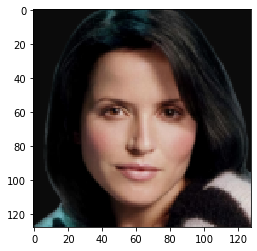

In [15]:
plt.imshow(faces_128_df['face'].values[0])

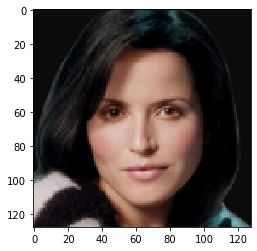

In [16]:
plt.imshow(np.fliplr(faces_128_df['face'].values[0]))

In [17]:
faces_128_df = pd.merge(faces_128_df, anno_df[['id', 'hair_category']], on=['id'])

In [18]:
len(faces_128_df)

30000

In [19]:
import copy

In [20]:
flipped_faces = [np.fliplr(i) for i in tqdm(faces_128_df.face.values)]

In [21]:
faces_128_df_flipped = copy.deepcopy(faces_128_df)

In [22]:
faces_128_df_flipped['faces'] = flipped_faces

In [23]:
faces_128_df = pd.concat([faces_128_df, faces_128_df_flipped]).reset_index()

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [24]:
faces_128_df['subset'] = 'train'
faces_128_df.loc[0:1000, 'subset'] = 'valid'
faces_128_df.loc[1000:1999, 'subset'] = 'test'

In [25]:
faces_128_df[:3]

,index,face,faces,hair_category,id,subset
0,0,"[[[0.046875, 0.046875, 0.046875], [0.046875, 0...",NaN,None,20142,valid
1,1,"[[[0.046875, 0.046875, 0.046875], [0.046875, 0...",NaN,None,8126,valid
2,2,"[[[0.046875, 0.046875, 0.046875], [0.046875, 0...",NaN,None,12655,valid


In [26]:
faces_128_df[-1:]

,index,face,faces,hair_category,id,subset
59999,29999,"[[[0.046875, 0.046875, 0.046875], [0.046875, 0...","[[[0.046875, 0.046875, 0.046875], [0.046875, 0...",None,17714,train


In [27]:
{hair_types[int(i)]:np.sum(faces_128_df['hair_category'] == i) for i in faces_128_df.hair_category.unique() if i in [0, 1,2,3,4]}

{}

In [28]:
Y_train = np.array(list(faces_128_df.hair_category.values[faces_128_df.subset == 'train'])).astype('float32')
Y_valid = np.array(list(faces_128_df.hair_category.values[faces_128_df.subset == 'valid'])).astype('float32')
Y_test = np.array(list(faces_128_df.hair_category.values[faces_128_df.subset == 'test'])).astype('float32')

In [29]:
X_train = np.array(list(faces_128_df.face.values[faces_128_df.subset == 'train'])) #/ 255.
X_valid = np.array(list(faces_128_df.face.values[faces_128_df.subset == 'valid']))# / 255.
X_test = np.array(list(faces_128_df.face.values[faces_128_df.subset == 'test'])) #/ 255.

In [30]:
np.array(list(faces_128_df.face.values[faces_128_df.subset == 'train'])).shape

(58000, 128, 128, 3)

In [31]:
X_train_flat = X_train.reshape((len(X_train), np.product(np.shape(X_train)[1:])))

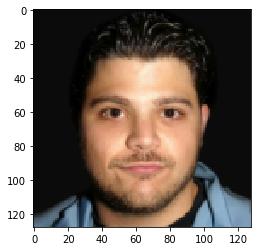

In [32]:
plt.imshow(X_train[0])

In [33]:
X_train_flat.shape, X_valid.shape, X_test.shape

((58000, 49152), (1000, 128, 128, 3), (1000, 128, 128, 3))

### define networks

In [34]:
dims = IMAGE_SHAPE = (128,128,3) 

### Keras network

In [35]:
#https://github.com/shaoanlu/MUNIT-keras/blob/master/MUNIT_keras.ipynb

In [36]:
# Architecture configs
IMAGE_SHAPE = (128,128,3)  # (128, 128, 3)
nc_in = 3 # number of input channels of generators
nc_D_inp = 3 # number of input channels of discriminators
n_dim_style = 8
n_resblocks = 4 # number of residual blocks in decoder and content encoder
n_adain = 2*n_resblocks
n_dim_adain = 256
nc_base = 64 # Number of channels of the first conv2d of encoder
n_downscale_content = 4 # Number of content encoder dowscaling
n_dowscale_style = 4 # Number of style encoder dowscaling
use_groupnorm = False # else use_layer norm in upscaling blocks
w_l2 = 1e-4 # L2 weight regularization
conv_init = 'he_normal'

In [37]:
from tensorflow.keras.models import Sequential, Model
#from tensorflow.keras.layers import *
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.activations import relu
from tensorflow.keras.initializers import RandomNormal
#from tensorflow.keras.applications import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Input
from tensorflow.keras import regularizers

In [38]:
from tensorflow_addons.layers import InstanceNormalization, GroupNormalization

In [39]:
from tensorflow.keras.layers import (
    Lambda,
    Conv2D,
    GlobalAveragePooling2D,
    Dense,
    Reshape,
    Add,
    UpSampling2D,
    Flatten,
)

In [40]:
def ReflectPadding2D(x, pad=1):
    x = Lambda(
        lambda x: tf.pad(x, [[0, 0], [pad, pad], [pad, pad], [0, 0]], mode="REFLECT")
    )(x)
    return x


def conv_block(input_tensor, f, k=3, strides=2, use_norm=False):
    x = input_tensor
    x = ReflectPadding2D(x)
    x = Conv2D(
        f,
        kernel_size=k,
        strides=strides,
        kernel_initializer=conv_init,
        kernel_regularizer=regularizers.l2(w_l2),
        use_bias=(not use_norm),
        padding="valid",
    )(x)
    if use_norm:
        x = InstanceNormalization(epsilon=1e-5)(x)
    x = relu(x)
    return x


def conv_block_d(input_tensor, f, use_norm=False):
    x = input_tensor
    x = ReflectPadding2D(x, 2)
    x = Conv2D(
        f,
        kernel_size=4,
        strides=2,
        kernel_initializer=conv_init_dis,
        kernel_regularizer=regularizers.l2(w_l2),
        use_bias=(not use_norm),
        padding="valid",
    )(x)
    if use_norm:
        x = InstanceNormalization(epsilon=1e-5)(x)
    x = LeakyReLU(alpha=0.2)(x)
    return x


def upscale_nn(inp, f, use_norm=False):
    x = inp
    x = UpSampling2D()(x)
    x = ReflectPadding2D(x, 2)
    x = Conv2D(
        f,
        kernel_size=5,
        kernel_initializer=conv_init,
        kernel_regularizer=regularizers.l2(w_l2),
        use_bias=(not use_norm),
        padding="valid",
    )(x)
    if use_norm:
        if use_groupnorm:
            x = GroupNormalization(groups=32)(x)
        else:
            x = GroupNormalization(groups=f)(x)  # group=f equivalant to layer norm
    x = relu(x)
    return x

In [41]:
def Encoder_style_MUNIT(
    nc_in=3,
    input_size=IMAGE_SHAPE[0],
    n_dim_adain=256,
    n_dim_style=n_dim_style,
    nc_base=nc_base,
    n_dowscale_style=n_dowscale_style,
):
    # Style encoder architecture
    inp = Input(shape=(input_size, input_size, nc_in))
    x = ReflectPadding2D(inp, 3)
    x = Conv2D(
        64,
        kernel_size=7,
        kernel_initializer=conv_init,
        kernel_regularizer=regularizers.l2(w_l2),
        use_bias=True,
        padding="valid",
    )(x)
    x = relu(x)

    dim = 1
    for i in range(n_dowscale_style):
        dim = 4 if dim >= 4 else dim * 2
        x = conv_block(x, dim * nc_base)
    x = GlobalAveragePooling2D()(x)
    style_code = Dense(n_dim_style, kernel_regularizer=regularizers.l2(w_l2))(
        x
    )  # Style code
    return Model(inp, style_code)

In [42]:
def Encoder_content_MUNIT(
    nc_in=3,
    input_size=IMAGE_SHAPE[0],
    n_downscale_content=n_downscale_content,
    nc_base=nc_base,
):
    # Content encoder architecture
    def res_block_content(input_tensor, f):
        x = input_tensor
        x = ReflectPadding2D(x)
        x = Conv2D(
            f,
            kernel_size=3,
            kernel_initializer=conv_init,
            kernel_regularizer=regularizers.l2(w_l2),
            use_bias=False,
            padding="valid",
        )(x)
        x = InstanceNormalization(epsilon=1e-5)(x)
        x = relu(x)
        x = ReflectPadding2D(x)
        x = Conv2D(
            f,
            kernel_size=3,
            kernel_initializer=conv_init,
            kernel_regularizer=regularizers.l2(w_l2),
            use_bias=False,
            padding="valid",
        )(x)
        x = InstanceNormalization(epsilon=1e-5)(x)
        x = Add()([x, input_tensor])
        return x

    inp = Input(shape=(input_size, input_size, nc_in))
    x = ReflectPadding2D(inp, 3)
    x = Conv2D(
        64,
        kernel_size=7,
        kernel_initializer=conv_init,
        kernel_regularizer=regularizers.l2(w_l2),
        use_bias=False,
        padding="valid",
    )(x)
    x = InstanceNormalization()(x)  #
    x = relu(x)  #

    dim = 1
    ds = 2 ** n_downscale_content
    for i in range(n_downscale_content):
        dim = 4 if dim >= 4 else dim * 2
        x = conv_block(x, dim * nc_base, use_norm=True)
    for i in range(n_resblocks):
        x = res_block_content(x, dim * nc_base)
    content_code = x  # Content code
    return Model(inp, content_code)

In [43]:
##################################################################################
# MUNIT Model Architecture, Decoder
##################################################################################
def MLP_MUNIT(
    n_dim_style=n_dim_style, n_dim_adain=n_dim_adain, n_blk=3, n_adain=2 * n_resblocks
):
    # MLP for AdaIN parameters
    inp_style_code = Input(shape=(n_dim_style,))

    adain_params = Dense(
        n_dim_adain, kernel_regularizer=regularizers.l2(w_l2), activation="relu"
    )(inp_style_code)
    for i in range(n_blk - 2):
        adain_params = Dense(
            n_dim_adain, kernel_regularizer=regularizers.l2(w_l2), activation="relu"
        )(adain_params)
    adain_params = Dense(
        2 * n_adain * n_dim_adain, kernel_regularizer=regularizers.l2(w_l2)
    )(
        adain_params
    )  # No output activation
    return Model(inp_style_code, [adain_params])


def Decoder_MUNIT(
    nc_in=256,
    input_size=IMAGE_SHAPE[0] // (2 ** n_downscale_content),
    n_dim_adain=256,
    n_resblocks=n_resblocks,
):
    def op_adain(inp):
        x = inp[0]
        mean, var = tf.nn.moments(x, [1, 2], keepdims=True)
        adain_bias = inp[1]
        adain_bias = Reshape((1, 1, n_dim_adain))(adain_bias)
        adain_weight = inp[2]
        adain_weight = Reshape((1, 1, n_dim_adain))(adain_weight)
        out = tf.nn.batch_normalization(
            x, mean, var, adain_bias, adain_weight, variance_epsilon=1e-7
        )
        return out

    def AdaptiveInstanceNorm2d(inp, adain_params, idx_adain):
        assert inp.shape[-1] == n_dim_adain
        x = inp
        idx_head = idx_adain * 2 * n_dim_adain
        adain_weight = Lambda(lambda x: x[:, idx_head : idx_head + n_dim_adain])(
            adain_params
        )
        adain_bias = Lambda(
            lambda x: x[:, idx_head + n_dim_adain : idx_head + 2 * n_dim_adain]
        )(adain_params)
        out = Lambda(op_adain)([x, adain_bias, adain_weight])
        return out

    def res_block_adain(inp, f, adain_params, idx_adain):
        x = inp
        x = ReflectPadding2D(x)
        x = Conv2D(
            f,
            kernel_size=3,
            kernel_initializer=conv_init,
            kernel_regularizer=regularizers.l2(w_l2),
            bias_regularizer=regularizers.l2(w_l2),
            use_bias=False,
            padding="valid",
        )(x)
        x = Lambda(lambda x: AdaptiveInstanceNorm2d(x[0], x[1], idx_adain))(
            [x, adain_params]
        )
        x = relu(x)
        x = ReflectPadding2D(x)
        x = Conv2D(
            f,
            kernel_size=3,
            kernel_initializer=conv_init,
            kernel_regularizer=regularizers.l2(w_l2),
            bias_regularizer=regularizers.l2(w_l2),
            use_bias=False,
            padding="valid",
        )(x)
        x = Lambda(lambda x: AdaptiveInstanceNorm2d(x[0], x[1], idx_adain + 1))(
            [x, adain_params]
        )

        x = Add()([x, inp])
        return x

    inp_style = Input((n_dim_style,))
    style_code = inp_style
    mlp = MLP_MUNIT()
    adain_params = mlp(style_code)

    inp_content = Input(shape=(input_size, input_size, nc_in))
    content_code = inp_content
    x = inp_content

    for i in range(n_resblocks):
        x = res_block_adain(x, nc_in, adain_params, 2 * i)

    dim = 1
    for i in range(n_downscale_content):
        dim = dim if nc_in // dim <= 64 else dim * 2
        # Note: original MUNIT uses layer norm instead of group norm in upscale blocks
        x = upscale_nn(x, nc_in // dim, use_norm=True)
    x = ReflectPadding2D(x, 3)
    out = Conv2D(
        3,
        kernel_size=7,
        kernel_initializer=conv_init,
        kernel_regularizer=regularizers.l2(w_l2),
        padding="valid",
        activation="tanh",
    )(x)
    return Model([inp_style, inp_content], [out, style_code, content_code])

In [44]:
X_train.shape

(58000, 128, 128, 3)

In [45]:
encoder_style = Encoder_style_MUNIT()
encoder_content = Encoder_content_MUNIT()
decoder_net = Decoder_MUNIT()

In [46]:
encoder_content(X_train[:5]).shape

W0716 22:49:51.576964 140626173667136 base_layer.py:1790] Layer lambda_5 is casting an input tensor from dtype float64 to the layer's dtype of float32, which is new behavior in TensorFlow 2.  The layer has dtype float32 because it's dtype defaults to floatx.

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



TensorShape([5, 8, 8, 256])

In [47]:
encoder_style(X_train[:5]).shape

W0716 22:49:53.555974 140626173667136 base_layer.py:1790] Layer lambda is casting an input tensor from dtype float64 to the layer's dtype of float32, which is new behavior in TensorFlow 2.  The layer has dtype float32 because it's dtype defaults to floatx.

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



TensorShape([5, 8])

In [48]:
out, style_code, content_code = decoder_net([encoder_style(X_train[:5]), encoder_content(X_train[:5])])

In [49]:
out.shape

TensorShape([5, 128, 128, 3])

In [50]:
style_code.shape

TensorShape([5, 8])

In [51]:
content_code.shape

TensorShape([5, 8, 8, 256])

In [52]:
Flatten()(content_code).shape

TensorShape([5, 16384])

### Create encoder and decoder

In [53]:
input_img = Input(shape=IMAGE_SHAPE)

In [54]:
from tensorflow.keras.layers import Concatenate

In [55]:
Flatten()(encoder_content(input_img)).shape

TensorShape([None, 16384])

In [56]:
Flatten()(encoder_style(input_img))

<tf.Tensor 'flatten_2/Identity:0' shape=(None, 8) dtype=float32>

In [57]:
z = Concatenate()([Flatten()(encoder_content(input_img)), Flatten()(encoder_style(input_img))])
z

<tf.Tensor 'concatenate/Identity:0' shape=(None, 16392) dtype=float32>

In [58]:
encoder = Model([input_img], [z])

In [59]:
z.shape[1]

16392

In [60]:
input_z = Input(shape=(z.shape[1]))

In [61]:
input_z

<tf.Tensor 'input_7:0' shape=(None, 16392) dtype=float32>

In [62]:
content_z, style_z = tf.split(input_z, (z.shape[1] - n_dim_style, n_dim_style), axis=1)
content_z, style_z 

(<tf.Tensor 'split:0' shape=(None, 16384) dtype=float32>,
 <tf.Tensor 'split:1' shape=(None, 8) dtype=float32>)

In [63]:
content_z = Reshape((8, 8, 256))(content_z)

In [64]:
reconstruction, _, _ = decoder_net([style_z, content_z])

In [65]:
reconstruction

<tf.Tensor 'model_3_1/Identity:0' shape=(None, 128, 128, 3) dtype=float32>

In [66]:
decoder = Model([input_z], [reconstruction])

In [67]:
decoder

In [68]:
# encoder should return a concatenation of style_code and content_code
# decoder should pull these back apart and reshape them

### Create model and train

In [69]:
embedder = tfUMAP(
    direct_embedding=False,
    verbose=True,
    negative_sample_rate=5,
    training_epochs=1,
    encoder=encoder,
    decoding_method="autoencoder", 
    decoder=decoder,
    valid_X = X_valid,
    valid_Y = Y_valid,
    dims = dims,
    batch_size= 32
)

In [132]:
z = embedder.fit_transform(X_train_flat)

tfUMAP(batch_size=32,
       decoder=<tensorflow.python.keras.engine.training.Model object at 0x7fdf9c0a9f60>,
       decoding_method='autoencoder', dims=(128, 128, 3),
       encoder=<tensorflow.python.keras.engine.training.Model object at 0x7fe526c6a550>,
       max_sample_repeats_per_epoch=25, negative_sample_rate=5,
       optimizer=<tensorflow.python.keras.optimizer_v2.adam.Adam object at 0x7fdf...
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
      dtype=float32))
Construct fuzzy simplicial set
Fri Jul 17 10:15:14 2020 Finding Nearest

FailedPreconditionError:  Error while reading resource variable _AnonymousVar81 from Container: localhost. This could mean that the variable was uninitialized. Not found: Resource localhost/_AnonymousVar81/N10tensorflow3VarE does not exist.
	 [[node mul_441/ReadVariableOp (defined at /mnt/cube/tsainbur/Projects/github_repos/umap_tf_networks/tfumap/umap.py:382) ]] [Op:__inference_train_batch_22260]

Function call stack:
train_batch


In [71]:
encoder_style.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
lambda (Lambda)              (None, 134, 134, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 128, 128, 64)      9472      
_________________________________________________________________
tf_op_layer_Relu (TensorFlow multiple                  0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 130, 130, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 128)       73856     
_________________________________________________________________
tf_op_layer_Relu_1 (TensorFl multiple                  0     

In [72]:
encoder_content.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
lambda_5 (Lambda)               (None, 134, 134, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 128, 128, 64) 9408        lambda_5[0][0]                   
__________________________________________________________________________________________________
instance_normalization (Instanc (None, 128, 128, 64) 128         conv2d_5[0][0]                   
____________________________________________________________________________________________

In [73]:
embedder.encoder.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
model_1 (Model)                 (None, 8, 8, 256)    6282304     input_6[0][0]                    
__________________________________________________________________________________________________
model (Model)                   (None, 8)            1560712     input_6[0][0]                    
__________________________________________________________________________________________________
flatten_3 (Flatten)             (None, 16384)        0           model_1[2][0]                    
____________________________________________________________________________________________

In [74]:
embedder.decoder.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 16392)]      0                                            
__________________________________________________________________________________________________
tf_op_layer_split (TensorFlowOp [(None, 16384), (Non 0           input_7[0][0]                    
__________________________________________________________________________________________________
reshape_16 (Reshape)            (None, 8, 8, 256)    0           tf_op_layer_split[0][0]          
__________________________________________________________________________________________________
model_3 (Model)                 [(None, 128, 128, 3) 7078211     tf_op_layer_split[0][1]          
                                                                 reshape_16[0][0]           

In [75]:
z = embedder.transform(X_train_flat)

### Plot model output

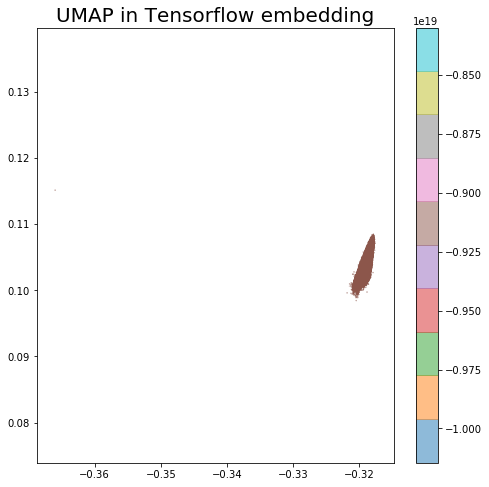

In [76]:
fig, ax = plt.subplots( figsize=(8, 8))
sc = ax.scatter(
    z[:, 0],
    z[:, 1],
    c=Y_train.astype(int)[:len(z)],
    cmap="tab10",
    s=0.1,
    alpha=0.5,
    rasterized=True,
)
ax.axis('equal')
ax.set_title("UMAP in Tensorflow embedding", fontsize=20)
plt.colorbar(sc, ax=ax);

### View loss

In [77]:
from tfumap.umap import retrieve_tensors
import seaborn as sns

In [78]:
loss_df = retrieve_tensors(embedder.tensorboard_logdir)
loss_df[:3]

['umap_loss', 'recon_loss']
[]


,wall_time,step,val,group,variable
0,1.594965e+09,1,1.295218,train,umap_loss
1,1.594965e+09,2,1.367174,train,umap_loss
2,1.594965e+09,3,1.359179,train,umap_loss


In [79]:
loss_df.group.unique()

array(['train'], dtype=object)

Text(0.5, 1.0, 'Reconstruction loss')

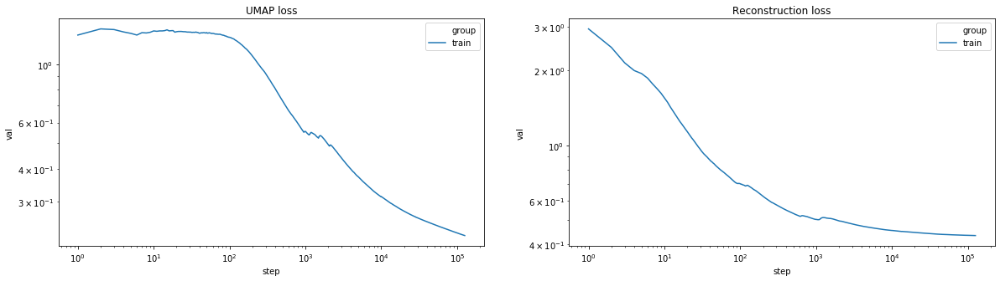

In [80]:
fig, axs = plt.subplots(ncols=2, figsize=(20,5))
ax = axs[0]
sns.lineplot(x="step", y="val", hue="group", data=loss_df[loss_df.variable=='umap_loss'], ax = ax, ci=None)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_title('UMAP loss')

ax = axs[1]
sns.lineplot(x="step", y="val", hue="group", data=loss_df[loss_df.variable=='recon_loss'], ax = ax, ci=None)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_title('Reconstruction loss')

### Save output

In [81]:
from tfumap.paths import ensure_dir, MODEL_DIR

In [82]:
output_dir = MODEL_DIR/'celeba'/ 'style_content_128_deeper_ae2-128' 
ensure_dir(output_dir)

In [83]:
#embedder.save(output_dir)

In [84]:
import os

In [85]:
embedder.encoder.save(os.path.join(output_dir, "encoder"))

W0717 09:29:06.250566 140626173667136 deprecation.py:506] From /mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tensorflow_core/python/ops/resource_variable_ops.py:1786: calling BaseResourceVariable.__init__ (from tensorflow.python.ops.resource_variable_ops) with constraint is deprecated and will be removed in a future version.
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
I0717 09:29:07.132085 140626173667136 builder_impl.py:775] Assets written to: /mnt/cube/tsainbur/Projects/github_repos/umap_tf_networks/models/celeba/style_content_128_deeper_ae2-128/encoder/assets


In [86]:
import pickle

In [87]:
#with open(os.path.join(output_dir, "model.pkl"), "w") as output:
#    pickle.dump(embedder, output, protocol=4)

In [88]:
#pickle.dump(embedder, open(os.path.join(output_dir, "model.pkl"), 'w'), protocol=4)

In [89]:
loss_df.to_pickle(output_dir / 'loss_df.pickle')

In [90]:
np.save(output_dir / 'z.npy', z)

### View reconstructions on test data

In [91]:
z_test = embedder.transform(X_test)

In [92]:
np.shape(z_test)

(1000, 16392)

In [93]:
X_test_recon = embedder.inverse_transform(z_test)

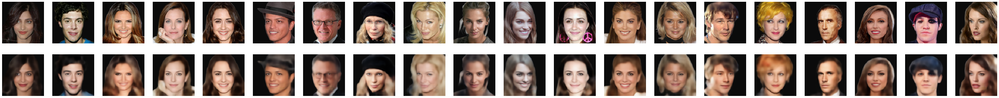

In [94]:
nex = 20
fig, axs = plt.subplots(ncols=nex, nrows=2, figsize=(nex*3,2*3))
for i in range(nex):
    axs[0,i].imshow(X_test[i].reshape(dims))
    axs[1,i].imshow(X_test_recon[i].reshape(dims))
for ax in axs.flatten():
    ax.axis('off')

### Interpolations on test data

In [95]:
nex = 10

In [96]:
interp_pts = np.linspace(0, 1, nex)

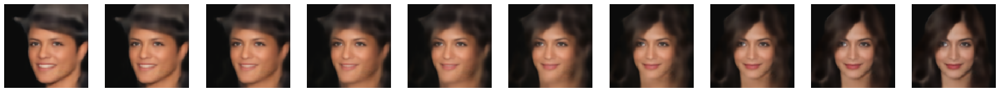

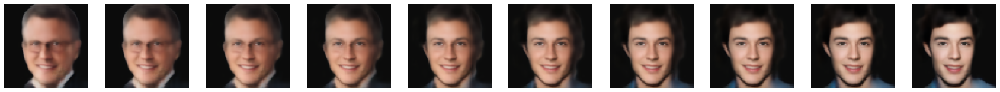

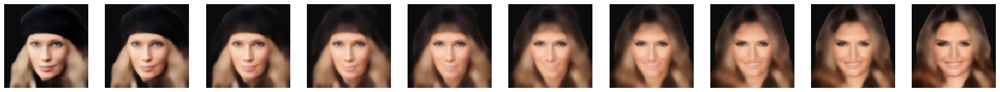

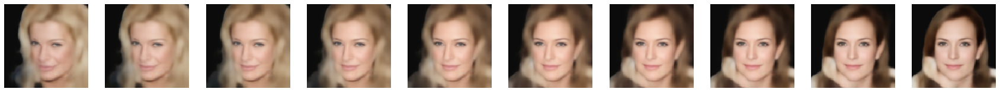

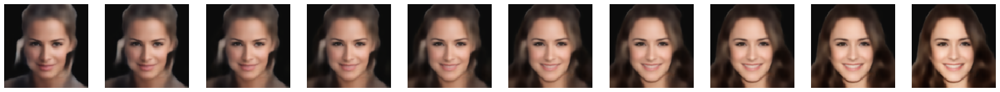

In [97]:
for i,j in zip(np.arange(0,5), np.arange(5,10)):
    z1 = z_test[i]
    z2 = z_test[j]
    z_interp = [z1*i + z2*(1-i) for i in interp_pts]
    x_interp = embedder.inverse_transform(np.array(z_interp))

    fig, axs = plt.subplots(ncols=nex, nrows=1, figsize=(nex*3,3))
    for i in range(nex):
        axs[i].imshow(x_interp[i].reshape(dims))
    for ax in axs.flatten():
        ax.axis('off')

    plt.show()

In [98]:
len(z_interp)

10

In [99]:
z_interp[0].shape

(16392,)

### Untangling latent factors

In [100]:
from statsmodels.api import OLS

In [101]:
faces_merged = pd.merge(anno_df, faces_128_df[['face', 'id']], on=['id'])

In [102]:
face_x = np.array(list(faces_merged['face'].values))
face_z = embedder.transform(face_x)
face_z.shape

(60000, 16392)

In [103]:
all_attr = faces_merged.drop(columns = ['id', 'hair_category', 'face'])
data_labels = 1.0*(all_attr == 1)
data_labels['bias'] = 1.0

In [104]:
model_z = OLS(face_z, data_labels)
result_z = model_z.fit()
result_z.params[:3]

,0,1,2,3,4,5,6,7,8,9,...,16382,16383,16384,16385,16386,16387,16388,16389,16390,16391
5_o_Clock_Shadow,-0.000081,-0.000182,-0.000002,0.000063,-0.000046,0.000135,0.000069,0.000079,0.000121,-0.000075,...,-0.005551,-0.000712,-0.111534,0.107901,-0.003163,-0.001401,0.231014,0.002950,-0.002501,-0.007018
Arched_Eyebrows,-0.000017,0.000133,-0.000051,0.000038,-0.000022,-0.000074,0.000022,0.000002,-0.000067,-0.000856,...,-0.004308,-0.002254,-0.003479,0.003365,0.000191,-0.000065,0.007211,-0.000235,0.000503,0.000632
Attractive,0.000032,0.000099,-0.000006,-0.000072,0.000090,-0.000037,0.000013,-0.000056,-0.000011,0.000726,...,0.001477,0.000650,-0.131481,0.127145,-0.003755,-0.001904,0.271307,0.003754,-0.002521,-0.015422


In [105]:
z_model = result_z.params.values[:-1]
z_labels = list(result_z.params.index)[:-1]
bias = result_z.params.loc['bias'].values

In [106]:
#bias = np.mean(face_z,axis=0)

In [107]:
x_interp = embedder.inverse_transform(np.array(z_interp))

In [108]:
z_labels_bias = np.array([bias + i for i in z_model])
x_labels = embedder.inverse_transform(np.array(z_labels_bias).astype('float32'))

In [109]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))

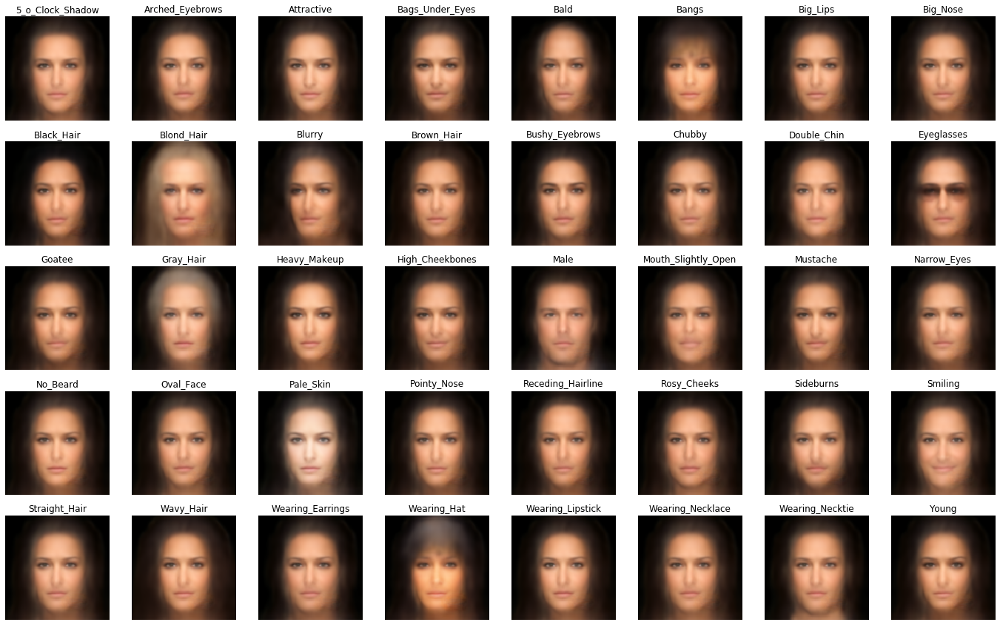

In [110]:
fig, axs = plt.subplots(ncols=8, nrows=5, figsize=(8*3,5*3))
for i, (lab, img) in tqdm(enumerate(zip(z_labels, x_labels))):
    ax = axs.flatten()[i]
    ax.imshow(norm(img))
    ax.set_title(lab)
    ax.axis('off')

In [111]:
z_labels_bias = np.array([bias+i*3 for i in z_model])
x_labels = embedder.inverse_transform(np.array(z_labels_bias).astype('float32'))

W0717 09:31:07.910356 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:07.930355 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


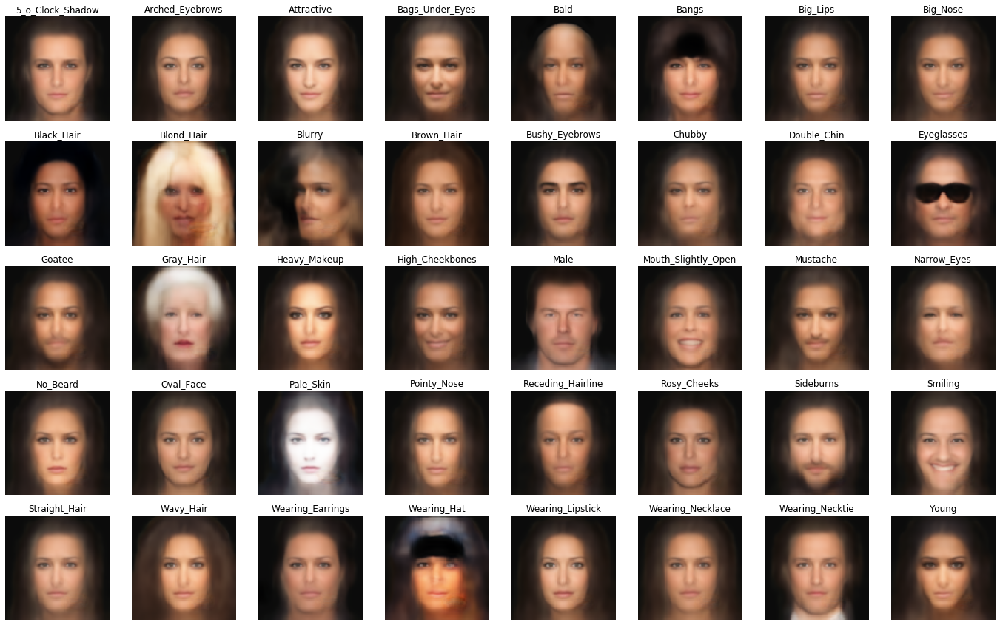

In [112]:
fig, axs = plt.subplots(ncols=8, nrows=5, figsize=(8*3,5*3))
for i, (lab, img) in tqdm(enumerate(zip(z_labels, x_labels))):
    ax = axs.flatten()[i]
    ax.imshow(img)
    ax.set_title(lab)
    ax.axis('off')

W0717 09:31:10.009929 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


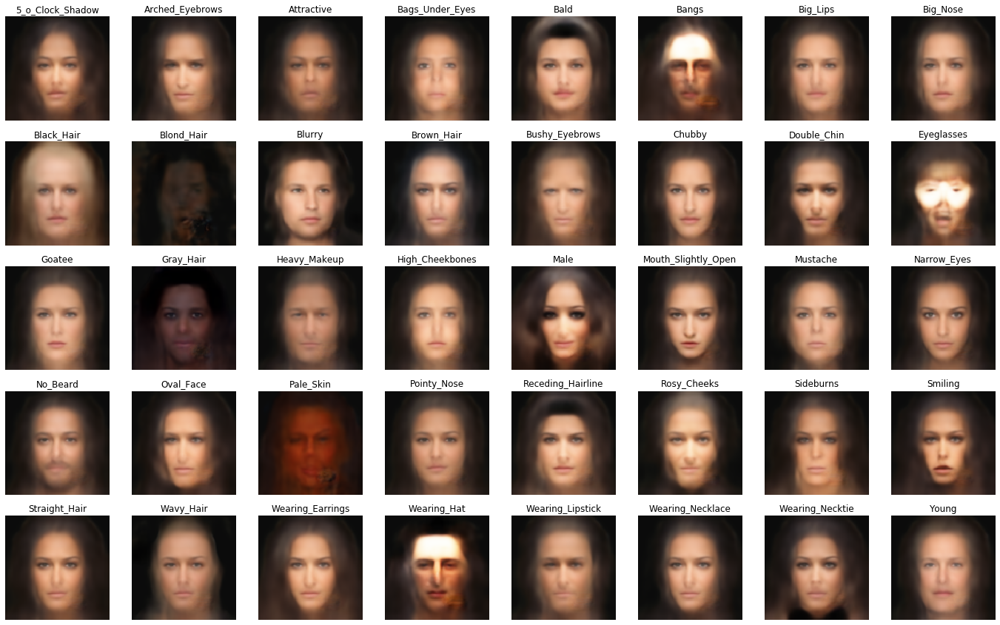

In [113]:
z_labels_bias = np.array([bias-i*3 for i in z_model])
x_labels = embedder.inverse_transform(np.array(z_labels_bias).astype('float32'))

fig, axs = plt.subplots(ncols=8, nrows=5, figsize=(8*3,5*3))
for i, (lab, img) in tqdm(enumerate(zip(z_labels, x_labels))):
    ax = axs.flatten()[i]
    ax.imshow(img)
    ax.set_title(lab)
    ax.axis('off')

### modify an image

In [114]:
example_person_z = z_test[1]

In [115]:
z_example_features = np.array([example_person_z+ i*3 for i in z_model])

In [116]:
x_example_features = embedder.inverse_transform(np.array(z_example_features).astype('float32'))

W0717 09:31:11.867308 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:11.870749 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:11.872423 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:11.890177 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:11.896228 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:11.897914 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


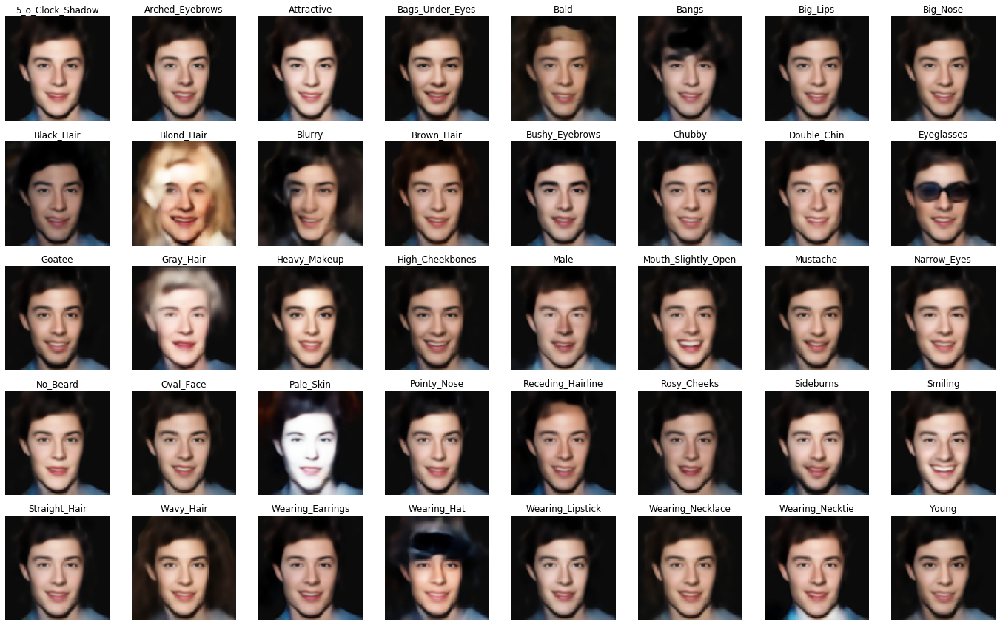

In [117]:
fig, axs = plt.subplots(ncols=8, nrows=5, figsize=(8*3,5*3))
for i, (lab, img) in tqdm(enumerate(zip(z_labels, x_example_features))):
    ax = axs.flatten()[i]
    ax.imshow(img)
    ax.set_title(lab)
    ax.axis('off')

W0717 09:31:13.548040 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:13.552535 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:13.554763 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:13.559573 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:13.565654 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:13.569422 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:13.576552 140626

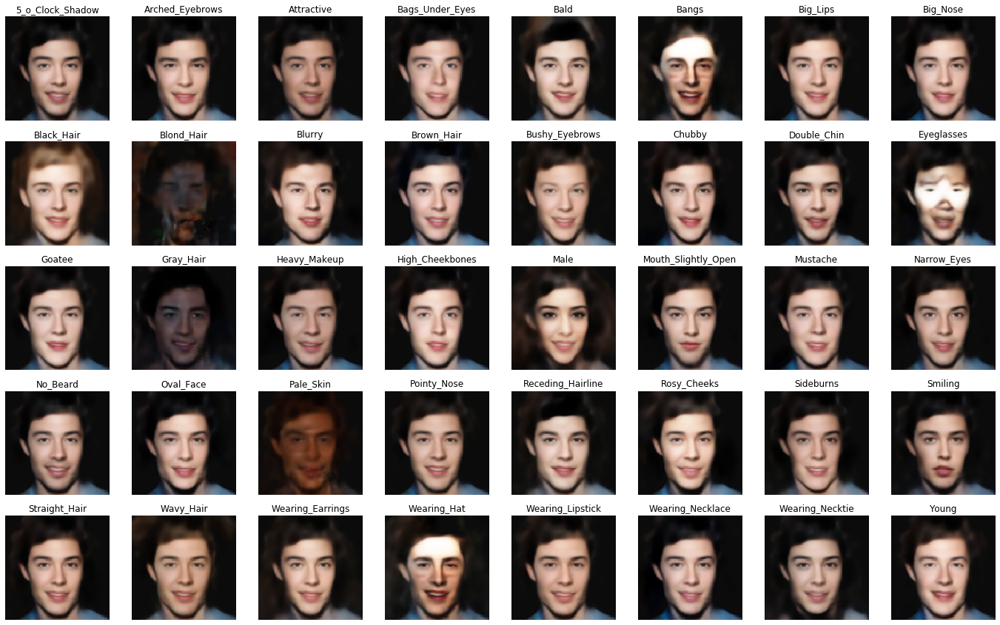

In [118]:
example_person_z = z_test[1]

z_example_features = np.array([example_person_z- i*3 for i in z_model])

x_example_features = embedder.inverse_transform(np.array(z_example_features).astype('float32'))

fig, axs = plt.subplots(ncols=8, nrows=5, figsize=(8*3,5*3))
for i, (lab, img) in tqdm(enumerate(zip(z_labels, x_example_features))):
    ax = axs.flatten()[i]
    ax.imshow(img)
    ax.set_title(lab)
    ax.axis('off')

### Reconstructions

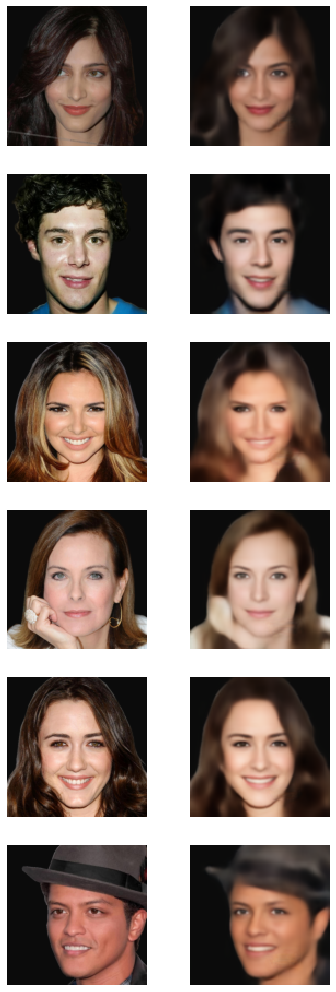

In [119]:
X_test_recon = embedder.inverse_transform(z_test)

nrows = 6
ncols = 2
nex = nrows
fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(3*ncols,3*nrows))
for i in range(nex):
    axs[i,0].imshow(X_test[i].reshape(dims))
    axs[i,1].imshow(X_test_recon[i].reshape(dims))
for ax in axs.flatten():
    ax.axis('off')

### Feature

W0717 09:31:18.087430 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 09:31:18.107411 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


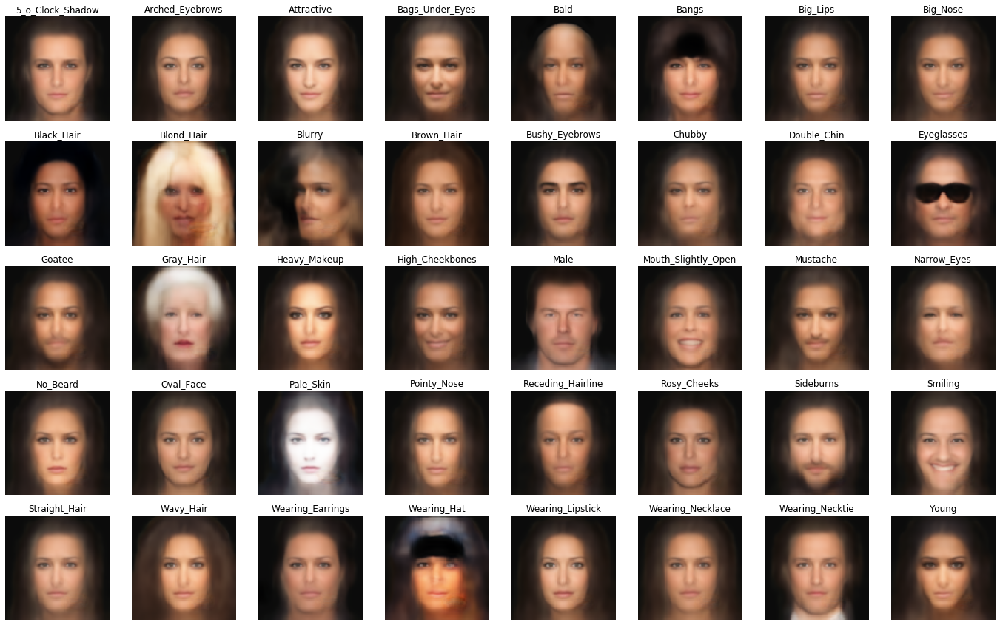

In [120]:
z_labels_bias = np.array([bias+i*3 for i in z_model])
x_labels = embedder.inverse_transform(np.array(z_labels_bias).astype('float32'))

fig, axs = plt.subplots(ncols=8, nrows=5, figsize=(8*3,5*3))
for i, (lab, img) in tqdm(enumerate(zip(z_labels, x_labels))):
    ax = axs.flatten()[i]
    ax.imshow(img)
    ax.set_title(lab)
    ax.axis('off')

In [121]:
z_model.shape

(40, 16392)

5_o_Clock_Shadow


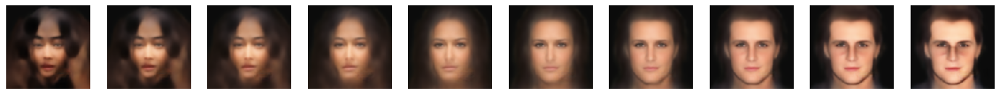

Arched_Eyebrows


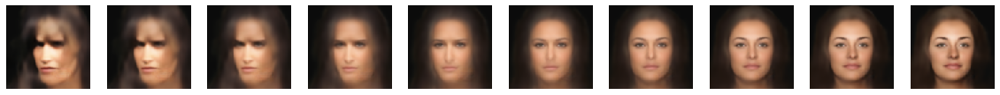

Attractive


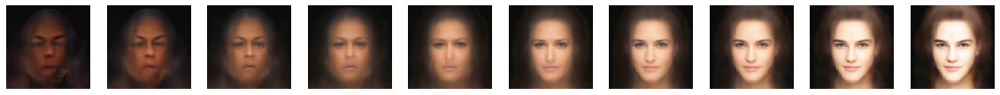

Bags_Under_Eyes


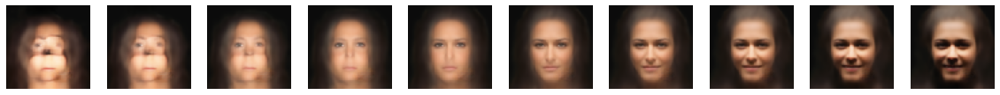

W0717 10:10:03.759464 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:03.762102 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:03.764595 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bald


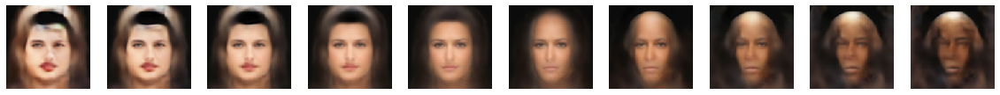

W0717 10:10:04.094355 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:04.095912 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:04.099370 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:04.100535 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:04.101686 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:04.102822 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bangs


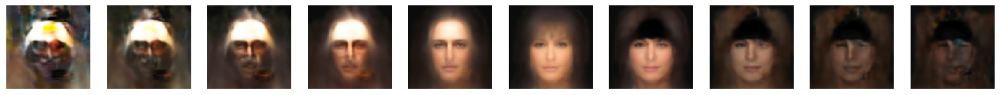

Big_Lips


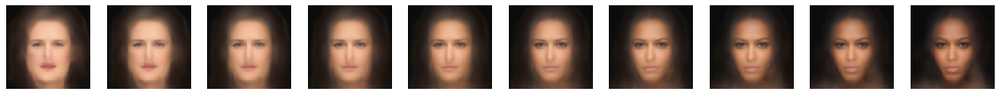

Big_Nose


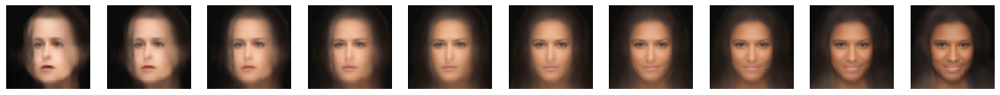

W0717 10:10:05.428297 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:05.430028 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Black_Hair


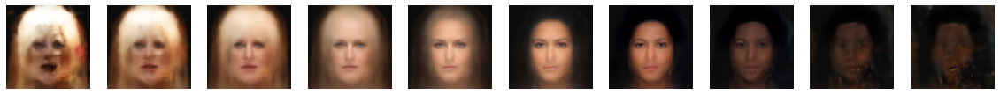

W0717 10:10:05.750369 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:05.752998 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:05.755523 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:05.759166 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:05.762695 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:05.763800 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:05.764928 140626

Blond_Hair


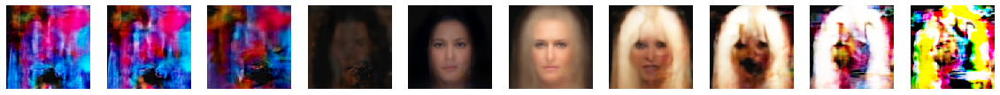

Blurry


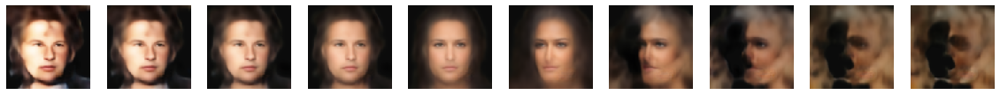

Brown_Hair


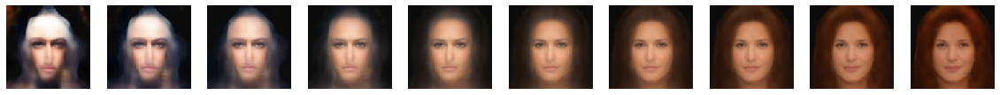

Bushy_Eyebrows


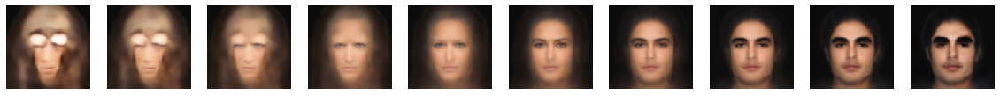

Chubby


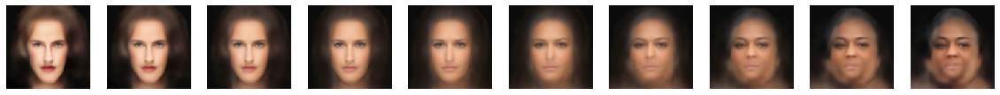

W0717 10:10:07.391167 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Double_Chin


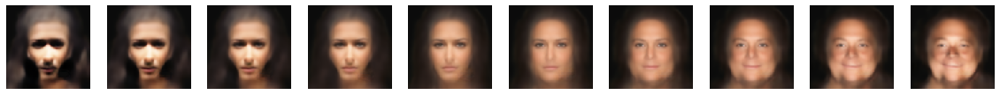

W0717 10:10:07.704170 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:07.705905 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:07.711548 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:07.713401 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:07.715768 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Eyeglasses


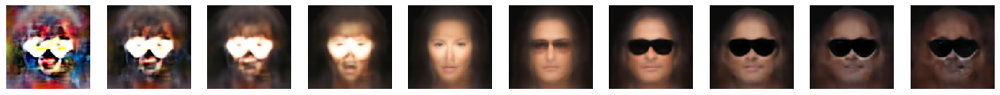

Goatee


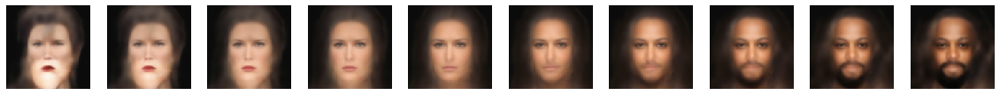

W0717 10:10:08.369072 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:08.371093 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:08.373041 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:08.376537 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:08.377982 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Gray_Hair


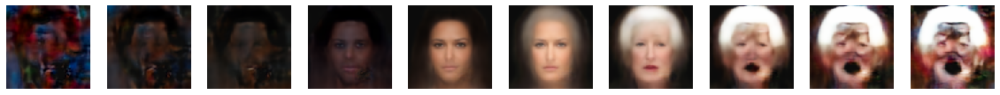

Heavy_Makeup


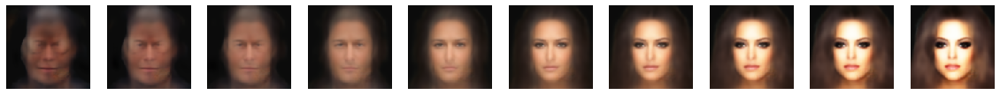

High_Cheekbones


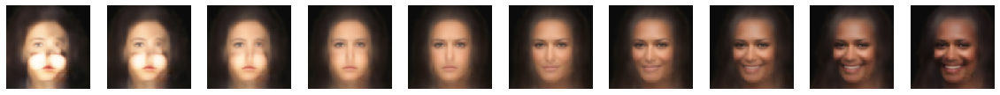

Male


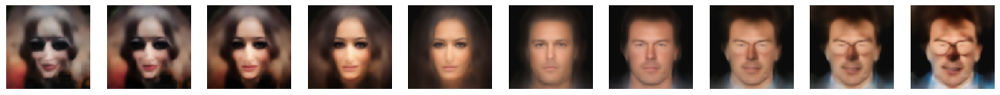

W0717 10:10:10.022814 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:10.024685 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Mouth_Slightly_Open


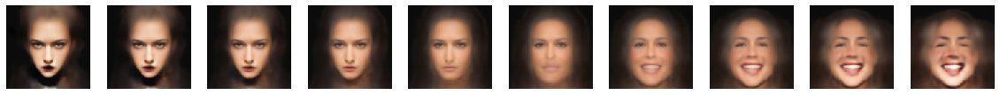

Mustache


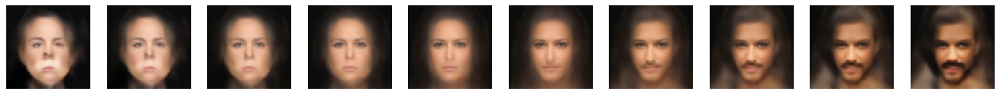

Narrow_Eyes


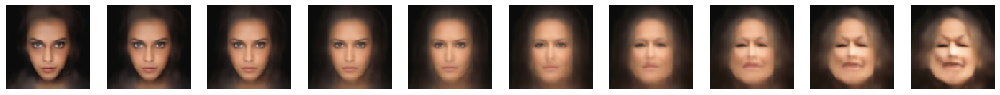

No_Beard


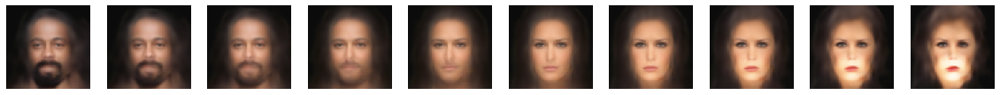

W0717 10:10:11.276635 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:11.278528 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Oval_Face


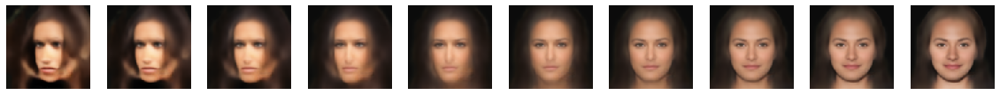

W0717 10:10:11.594713 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:11.596585 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:11.598155 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:11.602304 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:11.603790 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Pale_Skin


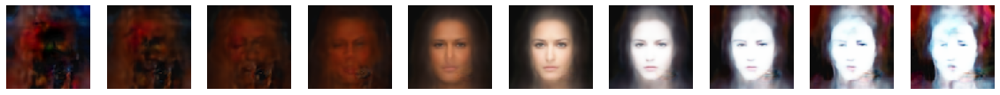

Pointy_Nose


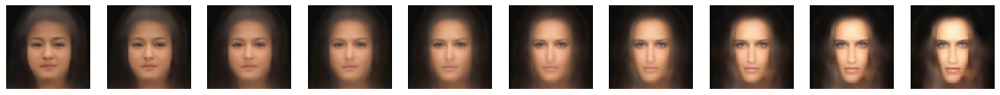

Receding_Hairline


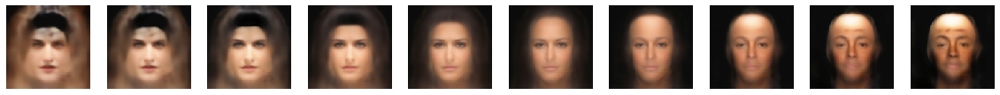

W0717 10:10:12.542344 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:12.544208 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rosy_Cheeks


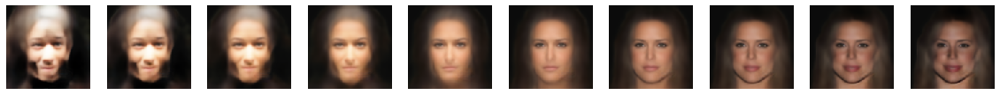

W0717 10:10:12.865650 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sideburns


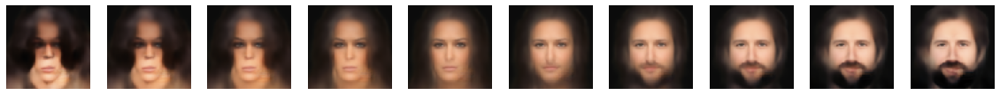

W0717 10:10:13.580143 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:13.582123 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Smiling


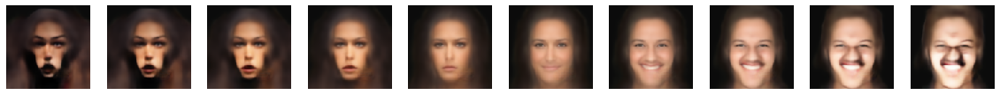

Straight_Hair


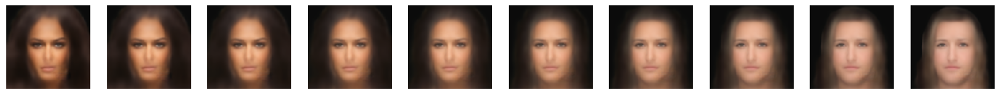

Wavy_Hair


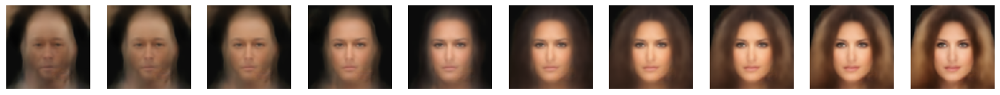

Wearing_Earrings


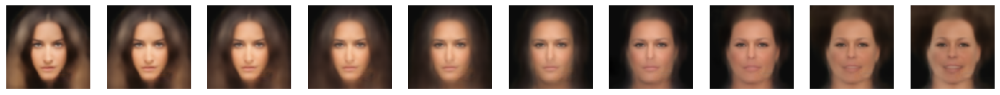

W0717 10:10:14.854329 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:14.856198 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:14.859913 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Wearing_Hat


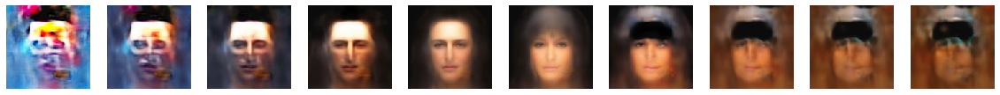

Wearing_Lipstick


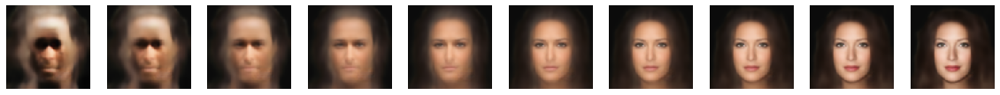

W0717 10:10:15.511163 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Wearing_Necklace


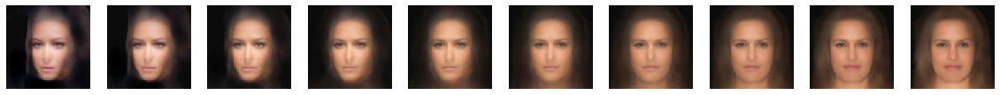

W0717 10:10:15.838158 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:10:15.839979 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Wearing_Necktie


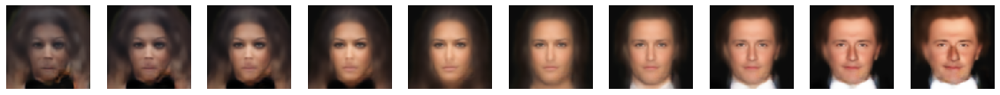

Young


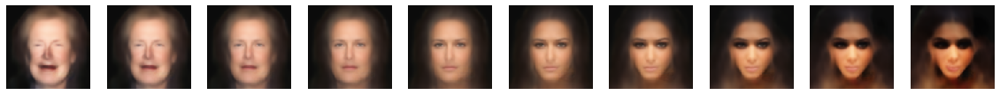

In [123]:
nex = 10
for li, (zmod, label) in enumerate(zip(z_model, z_labels)):
    print(label)
    trans = np.array([bias+i*zmod for i in np.linspace(-10,10,nex)])
    xtrans = embedder.inverse_transform(np.array(trans).astype('float32'))
    fig, axs = plt.subplots(ncols=nex, figsize=(nex*2, 2))
    for i, xt in enumerate(xtrans):
        axs[i].imshow(xt)
        axs[i].axis('off')
    plt.show()

### Add features to person

In [127]:
feats = [
    ["Male", -3, 3], 
    ["Receding_Hairline", -5, 5], 
    ["Bangs", 0, 3],
    ["Black_Hair", -5, 5],
    ["Blond_Hair", -2, 2],
    ["Bushy_Eyebrows", -2, 5],
    ["Double_Chin", -8, 10],
    ["Eyeglasses", 0, 5],
    ["Gray_Hair", 0, 5],
    ["Smiling", -2, 2],
    ["Wearing_Necktie", 0, 10],
    ["Young", -8, 5],

]

In [128]:
example_person_z = z_test[0]

Male


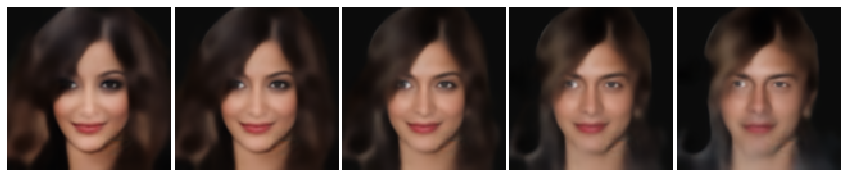

W0717 10:13:03.254896 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Receding_Hairline


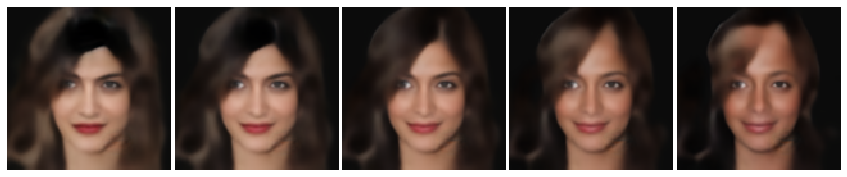

W0717 10:13:03.492377 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0717 10:13:03.494179 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bangs


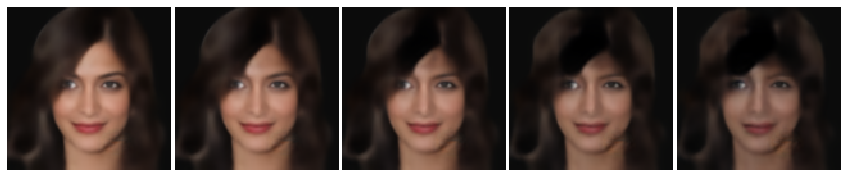

Black_Hair


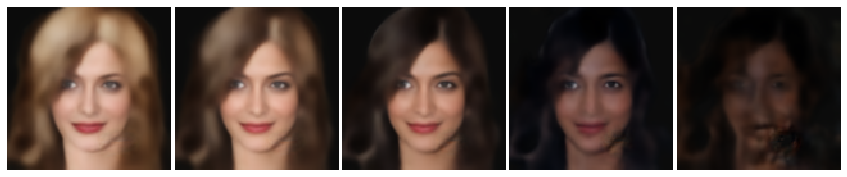

Blond_Hair


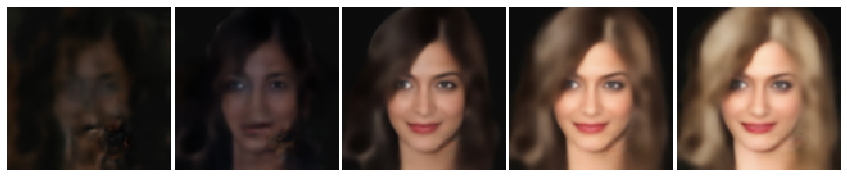

Bushy_Eyebrows


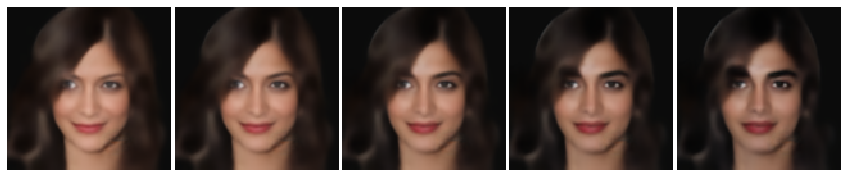

Double_Chin


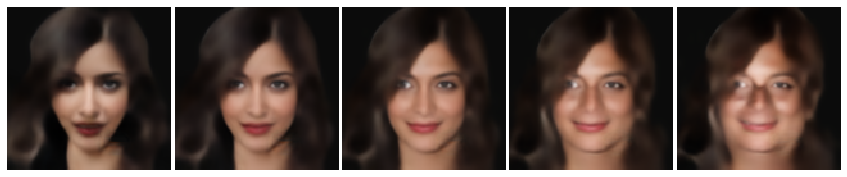

Eyeglasses


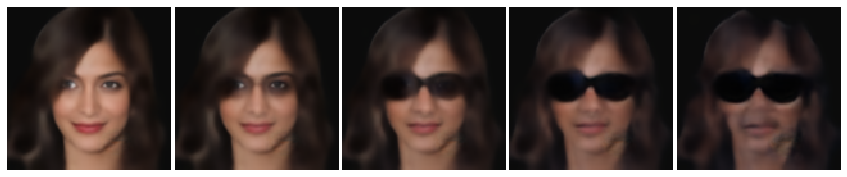

Gray_Hair


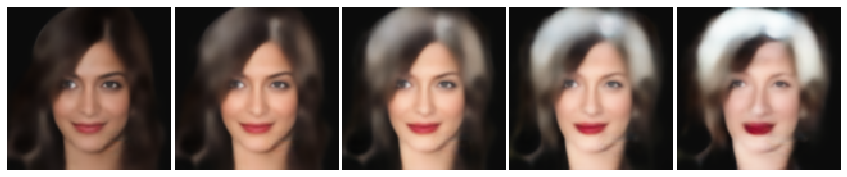

Smiling


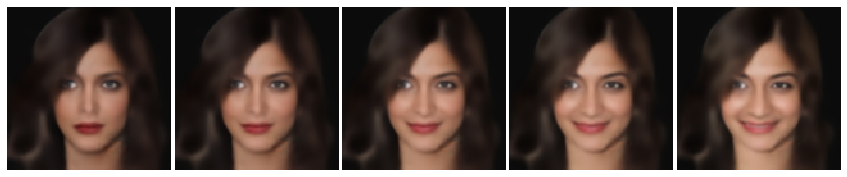

W0717 10:13:05.399671 140626173667136 image.py:700] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Wearing_Necktie


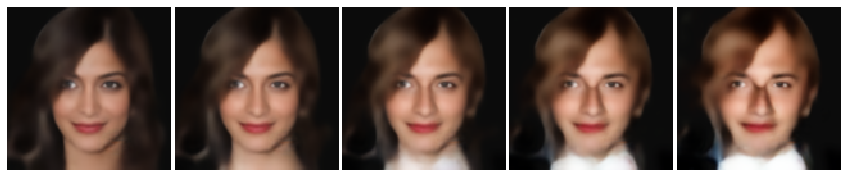

Young


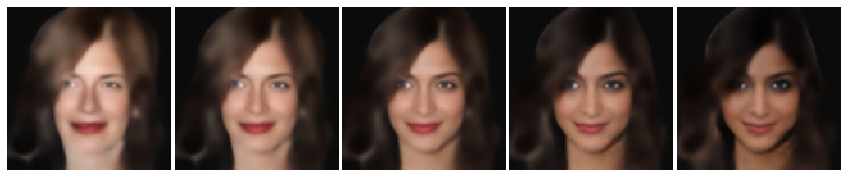

In [129]:
nex = 5
for li, (label, neg, pos) in enumerate(feats):
    print(label)
    zmod = z_model[np.where(label == np.array(z_labels))[0][0]]
    trans = np.array([example_person_z+i*zmod for i in np.linspace(neg,pos,nex)])
    xtrans = embedder.inverse_transform(np.array(trans).astype('float32'))
    fig, axs = plt.subplots(ncols=nex, figsize=(nex*3, 3), gridspec_kw = {'wspace':0, 'hspace':0})
    for i, xt in enumerate(xtrans):
        axs[i].imshow(xt)
        axs[i].axis('off')
    plt.show()

### Interpolation

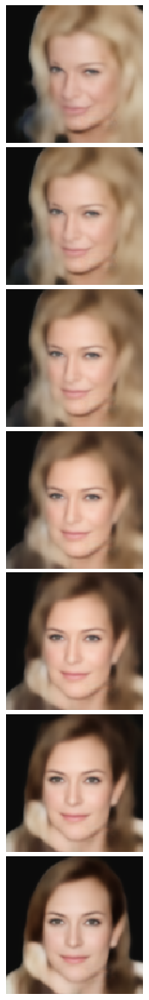

In [130]:
nex = 7

interp_pts = np.linspace(0, 1, nex)

#for i,j in zip(np.arange(10,15), np.arange(15,20)):
for i,j in [[3,8]]:#, [1,6], [14,19]]:
    z1 = z_test[i]
    z2 = z_test[j]
    z_interp = [z1*i + z2*(1-i) for i in interp_pts]
    x_interp = embedder.inverse_transform(np.array(z_interp))

    fig, axs = plt.subplots(ncols=1, nrows=nex, figsize=(3,nex*3), gridspec_kw = {'wspace':0, 'hspace':0.03})
    #fig, axs = plt.subplots(ncols=nex, nrows=1, figsize=(nex*3,3), gridspec_kw = {'wspace':0, 'hspace':0})
    for i in range(nex):
        axs[i].imshow(x_interp[i].reshape(dims))
    for ax in axs.flatten():
        ax.axis('off')

    plt.show()

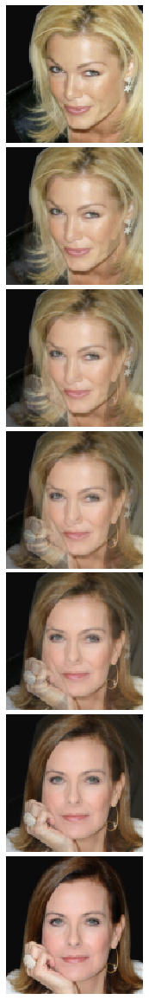

In [131]:
nex = 7

interp_pts = np.linspace(0, 1, nex)

#for i,j in zip(np.arange(10,15), np.arange(15,20)):
for i,j in [[3,8]]:#, [1,6], [14,19]]:
    z1 = X_test[i]
    z2 = X_test[j]
    x_interp = [z1*i + z2*(1-i) for i in interp_pts]
    #x_interp = embedder.inverse_transform(np.array(z_interp))

    fig, axs = plt.subplots(ncols=1, nrows=nex, figsize=(3,nex*3), gridspec_kw = {'wspace':0, 'hspace':0.03})
    #fig, axs = plt.subplots(ncols=nex, nrows=1, figsize=(nex*3,3), gridspec_kw = {'wspace':0, 'hspace':0})
    for i in range(nex):
        axs[i].imshow(x_interp[i].reshape(dims))
    for ax in axs.flatten():
        ax.axis('off')

    plt.show()